# WeRateDogs Twitter Data Wrangling

Krzysztof Satola  
from: https://github.com/ksatola/WeRateDogs-Twitter-Data-Wrangling

## Table of Contents

- [Project Objectives](#objectives)
- [Step 1: Gathering Data](#step1)
- [Step 2: Assessing Data](#step2)
- [Step 3: Cleaning Data](#step3)
- [Analysis and Visualization](#step4)

---
<a id='objectives'></a>
## Project objectives
- Perform data wrangling (gathering, assessing and cleaning) on provided thee sources of data.
- Store, analyze, and visualize the wrangled data.
- Reporting on 1) data wrangling efforts and 2) data analyses and visualizations (in separate documents).

### Additional Project Requirement
- In the analysis, only original tweets/ratings that have images should be used (no retweets nor replies).

---
### Imports & Options

In [1]:
import pandas as pd
import numpy as np
import requests
import tweepy # conda install -c conda-forge tweepy
import datetime
import os
import json
import matplotlib.pyplot as plt

%matplotlib inline

# Do not truncate data in cells
pd.set_option('display.max_colwidth', -1)

# Do not limit number of displayed columns
pd.set_option('display.max_columns', None)


def print_full(x):
    pd.set_option('display.max_rows', len(x))
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 2000)
    pd.set_option('display.float_format', '{:20,.2f}'.format)
    pd.set_option('display.max_colwidth', -1)
    #print(x)
    #pd.reset_option('display.max_rows')
    #pd.reset_option('display.max_columns')
    #pd.reset_option('display.width')
    #pd.reset_option('display.float_format')
    #pd.reset_option('display.max_colwidth')
    
#print_full(30)

### Constants & Controls

In [2]:
consumer_key = 'REMOVED'
consumer_secret = 'REMOVED'
access_token = 'REMOVED'
access_secret = 'REMOVED'

# To control sending api requests
SEND_API_REQUEST = True

---
<a id='step1'></a>
## Step 1: Gathering Data

Gather each of the three pieces of data:
1. The WeRateDogs Twitter archive (file on hand, manual download of 'twitter-archive-enhanced.csv')
2. The tweet image predictions ('image-predictions.tsv', what breed of dog or other object, animal, etc. is present in each tweet according to a neural network). This file should be downloaded programmatically using the Requests library and the following URL: https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv.
3. Store each tweet's entire set of JSON data (with at minimum tweet ID, retweet count, and favorite count) in a file called 'tweet_json.txt' using Twitter API and Python's Tweepy library. Each tweet's JSON data should be written to its own line.

---
### 1. Import 'twitter_archive_enhanced.csv' into a dataframe

In [3]:
# Read csv file and import it to a dataframe
df_arch = pd.read_csv('twitter-archive-enhanced.csv')

In [4]:
df_arch.head(2).T

,0,1
tweet_id,892420643555336193,892177421306343426
in_reply_to_status_id,NaN,NaN
in_reply_to_user_id,NaN,NaN
timestamp,2017-08-01 16:23:56 +0000,2017-08-01 00:17:27 +0000
source,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
text,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV"
retweeted_status_id,NaN,NaN
retweeted_status_user_id,NaN,NaN
retweeted_status_timestamp,NaN,NaN
expanded_urls,https://twitter.com/dog_rates/status/892420643555336193/photo/1,https://twitter.com/dog_rates/status/892177421306343426/photo/1


In [5]:
df_arch.shape

(2356, 17)

---
### 2. Import 'image-predictions.tsv' into a dataframe

In [6]:
file_name = 'image-predictions.tsv'

# Fetch data if file if doesn't exist
if not os.path.isfile(file_name):
    url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
    response = requests.get(url)

#response

In [7]:
# Save the response to 'image-predictions.tsv' file if doesn't exist
if not os.path.isfile(file_name):
    with open(file_name, mode='wb') as file:
        file.write(response.content)

In [8]:
# Load the 'image-predictions.tsv' file into a dataframe
df_pred = pd.read_csv(file_name, sep='\t')

In [9]:
df_pred.head(2).T

,0,1
tweet_id,666020888022790149,666029285002620928
jpg_url,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg
img_num,1,1
p1,Welsh_springer_spaniel,redbone
p1_conf,0.465074,0.506826
p1_dog,True,True
p2,collie,miniature_pinscher
p2_conf,0.156665,0.0741917
p2_dog,True,True
p3,Shetland_sheepdog,Rhodesian_ridgeback


In [10]:
df_pred.shape

(2075, 12)

---
### 3. Using Twitter API import tweets data into a dataframe

In [11]:
# Connect
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

# When sending requests to Twitter API
# - use OAuth method
# - automaticlly wait for rate limits to replenish
# - print notification when Tweepy is waiting for rate limits to replenish
api = tweepy.API(auth, wait_on_rate_limit=True, wait_on_rate_limit_notify=True)

# Testing
#for tweet_id in df_arch.tweet_id:
#    print(tweet_id)
#    tweet_response = api.get_status(tweet_id, tweet_mode='extended')
#    tweet_info = tweet_response._json  
#    break
#tweet_info

In [12]:
# Testing
#tweet_info['id']
#tweet_info['retweet_count']
#tweet_info['favorite_count']
#tweet_info['user']['followers_count']

In [13]:
# Import every tweet JSON data into 'tweet_json.txt' as a separate line
# wait for 15 minutes (automatically) each time the rate limit is hit 
# (for taking tweets data, the limit is 900 tweets per 15 minutes)

file_name = 'tweet_json.txt'

# Create a file, remove previous one if exists
#open(file_name, 'w').close()

# Create a file if it doesn't exist
if not os.path.isfile(file_name):
    open(file_name, 'w').close()

In [14]:
tweet_errors = {}
current_tweet_number = 0
tweet_data = []

if SEND_API_REQUEST:
    for tweet_id in df_arch.tweet_id:
        try:
            # Increment current_tweet_number
            current_tweet_number += 1

            # Start stamp
            print('-'*10)
            print('{} started at {}. Tweet_id -> {}'.format(current_tweet_number, datetime.datetime.now().time(), tweet_id))

            # Get request response
            tweet_response = api.get_status(tweet_id, tweet_mode='extended')
            tweet_info = tweet_response._json

            # Append to 'tweet_json.txt' file
            tweet_data.append(tweet_info)
            with open(file_name, 'w') as file:
                json.dump(tweet_data, file)

            # End stamp
            print('{} completed at {}'.format(current_tweet_number, datetime.datetime.now().time()))

            # Testing
            #if current_tweet_number > 50:
            #      break

        except Exception as e:
            # Record exceptions
            print(' -> {} EXCEPTION at {}'.format(current_tweet_number, datetime.datetime.now().time()))
            tweet_errors[str(tweet_id)] = str(e)

----------
1 started at 22:26:40.124963. Tweet_id -> 892420643555336193
1 completed at 22:26:40.463390
----------
2 started at 22:26:40.463493. Tweet_id -> 892177421306343426
2 completed at 22:26:40.838923
----------
3 started at 22:26:40.839716. Tweet_id -> 891815181378084864
3 completed at 22:26:41.197800
----------
4 started at 22:26:41.197941. Tweet_id -> 891689557279858688
4 completed at 22:26:41.661654
----------
5 started at 22:26:41.661802. Tweet_id -> 891327558926688256
5 completed at 22:26:42.074667
----------
6 started at 22:26:42.074845. Tweet_id -> 891087950875897856
6 completed at 22:26:42.487261
----------
7 started at 22:26:42.488079. Tweet_id -> 890971913173991426
7 completed at 22:26:42.811571
----------
8 started at 22:26:42.811683. Tweet_id -> 890729181411237888
8 completed at 22:26:43.132118
----------
9 started at 22:26:43.132258. Tweet_id -> 890609185150312448
9 completed at 22:26:43.464878
----------
10 started at 22:26:43.465017. Tweet_id -> 890240255349198849


Rate limit reached. Sleeping for: 372


901 completed at 22:41:46.526270
----------
902 started at 22:41:46.526534. Tweet_id -> 758474966123810816
902 completed at 22:41:47.373590
----------
903 started at 22:41:47.373782. Tweet_id -> 758467244762497024
903 completed at 22:41:48.081858
----------
904 started at 22:41:48.082348. Tweet_id -> 758405701903519748
904 completed at 22:41:48.883457
----------
905 started at 22:41:48.883663. Tweet_id -> 758355060040593408
905 completed at 22:41:49.723437
----------
906 started at 22:41:49.723696. Tweet_id -> 758099635764359168
906 completed at 22:41:50.470626
----------
907 started at 22:41:50.471315. Tweet_id -> 758041019896193024
907 completed at 22:41:51.105586
----------
908 started at 22:41:51.106060. Tweet_id -> 757741869644341248
908 completed at 22:41:51.776294
----------
909 started at 22:41:51.776556. Tweet_id -> 757729163776290825
909 completed at 22:41:52.522903
----------
910 started at 22:41:52.523083. Tweet_id -> 757725642876129280
910 completed at 22:41:53.188763
----

Rate limit reached. Sleeping for: 76


1801 completed at 22:56:52.627809
----------
1802 started at 22:56:52.627989. Tweet_id -> 676957860086095872
1802 completed at 22:56:53.818817
----------
1803 started at 22:56:53.818937. Tweet_id -> 676949632774234114
1803 completed at 22:56:55.087764
----------
1804 started at 22:56:55.087894. Tweet_id -> 676948236477857792
1804 completed at 22:56:56.012701
----------
1805 started at 22:56:56.012842. Tweet_id -> 676946864479084545
1805 completed at 22:56:57.143996
----------
1806 started at 22:56:57.144135. Tweet_id -> 676942428000112642
1806 completed at 22:56:58.291336
----------
1807 started at 22:56:58.291960. Tweet_id -> 676936541936185344
1807 completed at 22:57:04.301723
----------
1808 started at 22:57:04.301916. Tweet_id -> 676916996760600576
1808 completed at 22:57:05.328125
----------
1809 started at 22:57:05.328752. Tweet_id -> 676897532954456065
1809 completed at 22:57:06.698849
----------
1810 started at 22:57:06.699092. Tweet_id -> 676864501615042560
1810 completed at 2

In [15]:
# Extract selected Twitter API data from file to a list
tweet_list = []

with open(file_name) as file:
    tweets = json.load(file)
    for tweet in tweets:
        tweet_list.append({'tweet_id': tweet['id'],
                        'retweet_count': tweet['retweet_count'], 
                        'favorite_count': tweet['favorite_count'],
                        'followers_count': tweet['user']['followers_count']})
#tweet_list

In [16]:
# Create a dataframe from tweet_list list of dictionaries
df_api = pd.DataFrame(tweet_list, columns = ['tweet_id', 
                                            'retweet_count', 
                                            'favorite_count', 
                                            'followers_count'])

In [17]:
df_api.head(5).T

,0,1,2,3,4
tweet_id,892420643555336193,892177421306343426,891815181378084864,891689557279858688,891327558926688256
retweet_count,8377,6185,4092,8519,9227
favorite_count,38250,32791,24693,41578,39754
followers_count,7418513,7418513,7420630,7418513,7418513


In [18]:
tweet_errors.keys()

dict_keys(['888202515573088257', '873697596434513921', '872668790621863937', '869988702071779329', '866816280283807744', '861769973181624320', '845459076796616705', '842892208864923648', '837012587749474308', '827228250799742977', '802247111496568832', '775096608509886464', '770743923962707968', '754011816964026368'])

In [19]:
# Save API responses dataframe to pickle
if SEND_API_REQUEST:
    df_api.to_pickle("./tweet_json.pkl")

In [20]:
# Test: Read API responses from pickle
df_api = pd.read_pickle("./tweet_json.pkl")

In [21]:
df_api.head(5).T

,0,1,2,3,4
tweet_id,892420643555336193,892177421306343426,891815181378084864,891689557279858688,891327558926688256
retweet_count,8377,6185,4092,8519,9227
favorite_count,38250,32791,24693,41578,39754
followers_count,7418513,7418513,7420630,7418513,7418513


In [22]:
len(tweet_errors)

14

In [23]:
if SEND_API_REQUEST:
    tweet_errors['888202515573088257']

In [24]:
# Create a dataframe from tweet_errors dictionary
err_list = []

for item in tweet_errors:
    # Remove [] from both ends of the string s
    s = tweet_errors[item][1:-1] 
    # Replace \' with \", so the json parser can deserialize s into a dictionary
    s = s.replace("'", '"')
    #print(s)
    d = json.loads(s)
    err_list.append({'tweet_id': item,
                    'code' : d['code'],
                    'message' : d['message']})

# Create a dataframe from err_list list of dictionaries
df_api_err = pd.DataFrame(err_list, columns = ['tweet_id', 
                                            'code', 
                                            'message'])

In [25]:
df_api_err.head(5).T

,0,1,2,3,4
tweet_id,888202515573088257,873697596434513921,872668790621863937,869988702071779329,866816280283807744
code,144,144,144,144,144
message,No status found with that ID.,No status found with that ID.,No status found with that ID.,No status found with that ID.,No status found with that ID.


In [26]:
# Save API errors dataframe to pickle
if SEND_API_REQUEST:
    df_api_err.to_pickle("./tweet_json_error.pkl")

In [27]:
# Test: Read API errors from pickle
df_api_err = pd.read_pickle("./tweet_json_error.pkl")

In [28]:
df_api_err.head(2).T

,0,1
tweet_id,888202515573088257,873697596434513921
code,144,144
message,No status found with that ID.,No status found with that ID.


---
<a id='step2'></a>
## Step 2: Assessing Data

---
### df_arch - The WeRateDogs Twitter archive

- Original Twitter data dictionary: https://developer.twitter.com/en/docs/tweets/data-dictionary/overview/tweet-object.html

I will only focus on variables I plan to use later, namely:
- **tweet_id** (int64) unique identifier of a tweet
- **timestamp** (datetime) UTC time when this Tweet was created
- **source** (str) Utility used to post the Tweet, as an HTML-formatted string
- **text** (str) The actual UTF-8 text of the status update
- **rating_numerator** (int64) dog rating numerator
- **rating_denominator** (int64) dog rating denominator
- **name** - dog's name
- **doggo**, **floofer**, **pupper**, **puppo** are kind of a dog personality

In [29]:
df_arch.head(2).T

,0,1
tweet_id,892420643555336193,892177421306343426
in_reply_to_status_id,NaN,NaN
in_reply_to_user_id,NaN,NaN
timestamp,2017-08-01 16:23:56 +0000,2017-08-01 00:17:27 +0000
source,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
text,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV"
retweeted_status_id,NaN,NaN
retweeted_status_user_id,NaN,NaN
retweeted_status_timestamp,NaN,NaN
expanded_urls,https://twitter.com/dog_rates/status/892420643555336193/photo/1,https://twitter.com/dog_rates/status/892177421306343426/photo/1


In [30]:
# Review all records
df_arch.T

0  \
tweet_id                    892420643555336193                                                                                              
in_reply_to_status_id       NaN                                                                                                             
in_reply_to_user_id         NaN                                                                                                             
timestamp                   2017-08-01 16:23:56 +0000                                                                                       
source                      <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>                              
text                        This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU   
retweeted_status_id         NaN                                                                                                             
retweeted_status_user_id    NaN                                                                                                             
retweeted_status_timestamp  NaN                                                                                                             
expanded_urls               https://twitter.com/dog_rates/status/892420643555336193/photo/1                                                 
rating_numerator            13                                                                                                              
rating_denominator          10                                                                                                              
name                        Phineas                                                                                                         
doggo                       None                                                                                                            
floofer                     None                                                                                                            
pupper                      None                                                                                                            
puppo                       None                                                                                                            

                                                                                                                                                                                             1  \
tweet_id                    892177421306343426                                                                                                                                                   
in_reply_to_status_id       NaN                                                                                                                                                                  
in_reply_to_user_id         NaN                                                                                                                                                                  
timestamp                   2017-08-01 00:17:27 +0000                                                                                                                                            
source                      <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>                                                                                   
text                        This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV   
retweeted_status_id         NaN                                                                                                                                                                  
retweeted_status_user_id    NaN              

In [31]:
#df_arch.tweet_id.value_counts()
#df_arch.in_reply_to_status_id.value_counts()
#df_arch.in_reply_to_user_id.value_counts()
#df_arch.timestamp.value_counts()
#df_arch.source.value_counts()
#df_arch.text.value_counts()
#df_arch.retweeted_status_id.value_counts()
#df_arch.retweeted_status_user_id.value_counts()
#df_arch.retweeted_status_timestamp.value_counts()
#df_arch.expanded_urls.value_counts()
#df_arch.rating_numerator.value_counts()
#len(df_arch.rating_numerator.value_counts())

#df_arch.rating_denominator.value_counts()
#len(df_arch.rating_denominator.value_counts())

#df_arch.name.value_counts()
#df_arch.doggo.value_counts()
#df_arch.floofer.value_counts()
#df_arch.pupper.value_counts()
#df_arch.puppo.value_counts()

In [32]:
df_arch.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

In [33]:
# Show all records with not null values under in_reply_to_user_id column
# Transpose the table for better visibility and navigation
df_arch[~df_arch['in_reply_to_user_id'].isnull()].T

,30,55,64,113,148,149,179,184,186,188,189,218,228,234,251,274,290,291,313,342,346,387,409,427,498,513,565,570,576,611,701,843,857,967,1005,1016,1018,1080,1127,1295,1330,1339,1345,1356,1446,1452,1464,1474,1479,1497,1501,1523,1598,1605,1618,1630,1634,1663,1689,1774,1819,1842,1844,1852,1866,1882,1885,1892,1895,1905,1914,1940,2036,2038,2149,2169,2189,2298
tweet_id,886267009285017600,881633300179243008,879674319642796034,870726314365509632,863427515083354112,863079547188785154,857214891891077121,856526610513747968,856288084350160898,855862651834028034,855860136149123072,850333567704068097,848213670039564288,847617282490613760,844979544864018432,840698636975636481,838150277551247360,838085839343206401,835246439529840640,832088576586297345,831926988323639298,826598799820865537,823333489516937216,821153421864615936,813130366689148928,811647686436880384,802265048156610565,801854953262350336,800859414831898624,797165961484890113,786051337297522688,766714921925144576,763956972077010945,750381685133418496,747651430853525504,746906459439529985,746818907684614144,738891149612572673,729838605770891264,707983188426153984,705786532653883392,704871453724954624,704491224099647488,703425003149250560,696490539101908992,695767669421768709,694356675654983680,693644216740769793,693582294167244802,692423280028966913,692142790915014657,690607260360429569,686035780142297088,685681090388975616,684969860808454144,684538444857667585,684225744407494656,682808988178739200,681340665377193984,678023323247357953,676590572941893632,675870721063669760,675849018447167488,675707330206547968,675349384339542016,674999807681908736,674793399141146624,674754018082705410,674742531037511680,674606911342424069,674330906434379776,673716320723169284,671729906628341761,671550332464455680,669684865554620416,669353438988365824,668967877119254528,667070482143944705
in_reply_to_status_id,8.86266e+17,8.81607e+17,8.79554e+17,8.70726e+17,8.63426e+17,6.67152e+17,8.57157e+17,8.55818e+17,8.56286e+17,8.55862e+17,8.55859e+17,8.50329e+17,8.48212e+17,8.47606e+17,7.591e+17,8.40698e+17,8.38145e+17,8.38086e+17,8.35246e+17,8.32088e+17,8.31903e+17,8.26598e+17,8.23326e+17,8.21153e+17,8.13127e+17,8.11627e+17,7.33109e+17,8.01854e+17,8.00858e+17,7.97124e+17,7.72743e+17,7.66712e+17,7.63865e+17,7.5018e+17,7.47649e+17,7.46886e+17,6.91417e+17,7.38412e+17,7.29114e+17,7.0798e+17,7.03256e+17,6.67152e+17,7.04486e+17,7.03042e+17,6.96489e+17,6.75349e+17,6.70668e+17,6.93642e+17,6.93572e+17,6.92417e+17,6.92042e+17,6.90341e+17,6.86034e+17,6.85548e+17,6.8496e+17,6.84481e+17,6.84223e+17,6.82788e+17,6.81339e+17,6.78021e+17,6.76588e+17,6.75707e+17,6.75846e+17,6.75497e+17,6.75e+17,6.74793e+17,6.7173e+17,6.74752e+17,6.7474e+17,6.74469e+17,6.65815e+17,6.73716e+17,6.71561e+17,6.71545e+17,6.69354e+17,6.67806e+17,6.68921e+17,6.67066e+17
in_reply_to_user_id,2.28118e+09,4.73844e+07,3.10544e+09,1.64878e+07,7.75962e+07,4.19698e+09,1.80671e+08,4.19698e+09,2.79281e+08,1.94352e+08,1.36157e+07,2.19551e+07,4.19698e+09,4.19698e+09,4.19698e+09,8.40548e+17,2.19551e+07,2.89413e+09,2.62596e+07,3.05821e+07,2.06837e+07,4.19698e+09,1.58285e+09,1.13212e+08,4.19698e+09,4.19698e+09,4.19698e+09,1.18563e+07,2.91859e+08,2.91663e+07,7.30505e+17,4.19698e+09,1.58464e+07,4.7173e+09,4.19698e+09,4.19698e+09,4.19698e+09,3.58973e+08,4.19698e+09,2.31911e+09,4.19698e+09,4.19698e+09,2.87855e+07,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,1.19899e+09,4.19698e+09,4.19698e+09,4.67037e+08,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,1.63747e+07,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,4.19698e+09,2.14357e+07,4.19698e+09
timestamp,2017-07-15 16:51:35 +0000,2017-07-02 21:58:53 +0000,2017-06-27 12:14:36 +0000,2017-06-02 19:38:25 +0000,2017-05-13 16:15:35 +0000,2017-05-12 17:12:53 +0000,2017-04-26 12:48:51 +0000,2017-04-24 15:13:52 +0000,2017-04-23 23:26:03 +0000,2017-04-

In [34]:
# Count duplicated items for each variable (also visible by .info() above)

#sum(df_arch.tweet_id.duplicated())
#sum(df_arch.in_reply_to_status_id.duplicated()) #2278 NaNs
#df_arch[df_arch.in_reply_to_status_id.duplicated()].T
#sum(df_arch.in_reply_to_user_id.duplicated()) #2324 NaNs
#df_arch[df_arch.in_reply_to_user_id.duplicated()].T
#sum(df_arch.timestamp.duplicated())
#sum(df_arch.source.duplicated()) #2352 = 2356 - 4 categories
#df_arch[df_arch.source.duplicated()].T
#sum(df_arch.text.duplicated())
#sum(df_arch.retweeted_status_id.duplicated()) #2174 NaNs
#sum(df_arch.retweeted_status_user_id.duplicated()) #2330 NaNs
#sum(df_arch.retweeted_status_timestamp.duplicated()) #2174 NaNs
#sum(df_arch.expanded_urls.duplicated()) #137 of different values
#df_arch[df_arch.expanded_urls.duplicated()].T

#sum(df_arch.rating_numerator.duplicated()) #2316 in 40 different values
#df_arch[df_arch.rating_numerator.duplicated()].T

#sum(df_arch.rating_denominator.duplicated()) #2338 in 18 different values
#df_arch[df_arch.rating_denominator.duplicated()].T

#sum(df_arch.name.duplicated())
#sum(df_arch.doggo.duplicated())
#sum(df_arch.floofer.duplicated())
#sum(df_arch.pupper.duplicated())
#sum(df_arch.puppo.duplicated())

In [35]:
df_arch.sample(5)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
2164,669371483794317312,NaN,NaN,2015-11-25 04:26:12 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Oliviér. He's a Baptist Hindquarter. Also smooth af with the babes. 10/10 I'd totally get in a car with him https://t.co/fj4c170cxk,NaN,NaN,NaN,https://twitter.com/dog_rates/status/669371483794317312/photo/1,10,10,Oliviér,None,None,None,None
1044,743609206067040256,NaN,NaN,2016-06-17 01:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Stark. He just had his first ice cream cone. Got some on his nose. Requests your assistance. 10/10 would assist https://t.co/YwfN1lbpKA,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/743609206067040256/photo/1,https://twitter.com/dog_rates/status/743609206067040256/photo/1,https://twitter.com/dog_rates/status/743609206067040256/photo/1",10,10,Stark,None,None,None,None
547,805520635690676224,NaN,NaN,2016-12-04 21:14:20 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Zeke the Wonder Dog. He never let that poor man keep his frisbees. One of the Spartans all time greatest receivers. 13/10 RIP Zeke https://t.co/zacX7S6GyJ,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/805520635690676224/photo/1,https://twitter.com/dog_rates/status/805520635690676224/photo/1,https://twitter.com/dog_rates/status/805520635690676224/photo/1,https://twitter.com/dog_rates/status/805520635690676224/photo/1",13,10,Zeke,None,None,None,None
615,796563435802726400,NaN,NaN,2016-11-10 04:01:37 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @dog_rates: I want to finally rate this iconic puppo who thinks the parade is all for him. 13/10 would absolutely attend https://t.co/5d…,7.809316e+17,4.196984e+09,2016-09-28 00:46:20 +0000,https://twitter.com/dog_rates/status/780931614150983680/photo/1,13,10,None,None,None,None,puppo
1869,675153376133427200,NaN,NaN,2015-12-11 03:21:23 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",What kind of person sends in a picture without a dog in it? 1/10 just because that's a nice table https://t.co/RDXCfk8hK0,NaN,NaN,NaN,https://twitter.com/dog_rates/status/675153376133427200/photo/1,1,10,None,None,None,None,None


In [36]:
# Non-English characters spotted
#df_arch[df_arch['tweet_id'] == 668528771708952576]
df_arch.loc[2217]

tweet_id                      668528771708952576                                                                                                                         
in_reply_to_status_id         NaN                                                                                                                                        
in_reply_to_user_id           NaN                                                                                                                                        
timestamp                     2015-11-22 20:37:34 +0000                                                                                                                  
source                        <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>                                                         
text                          This is Gòrdón. He enjoys his razberrita by pool. Not a care in the world. 12/10 this dog has a better life than me http

In [37]:
# Are there any numerators <= 0?
df_arch[df_arch['rating_numerator'] <= 0].T

,315,1016
tweet_id,835152434251116546,746906459439529985
in_reply_to_status_id,NaN,7.46886e+17
in_reply_to_user_id,NaN,4.19698e+09
timestamp,2017-02-24 15:40:31 +0000,2016-06-26 03:22:31 +0000
source,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
text,When you're so blinded by your systematic plagiarism that you forget what day it is. 0/10 https://t.co/YbEJPkg4Ag,"PUPDATE: can't see any. Even if I could, I couldn't reach them to pet. 0/10 much disappointment https://t.co/c7WXaB2nqX"
retweeted_status_id,NaN,NaN
retweeted_status_user_id,NaN,NaN
retweeted_status_timestamp,NaN,NaN
expanded_urls,"https://twitter.com/dog_rates/status/835152434251116546/photo/1,https://twitter.com/dog_rates/status/835152434251116546/photo/1,https://twitter.com/dog_rates/status/835152434251116546/photo/1",https://twitter.com/dog_rates/status/746906459439529985/photo/1


In [38]:
df_arch[df_arch['tweet_id'] == 835152434251116546]['text']

315    When you're so blinded by your systematic plagiarism that you forget what day it is. 0/10 https://t.co/YbEJPkg4Ag
Name: text, dtype: object

In [39]:
df_arch[df_arch['tweet_id'] == 746906459439529985]['text']

1016    PUPDATE: can't see any. Even if I could, I couldn't reach them to pet. 0/10 much disappointment https://t.co/c7WXaB2nqX
Name: text, dtype: object

In [40]:
# Are there any denominators <= 0?
df_arch[df_arch['rating_denominator'] <= 0].T

,313
tweet_id,835246439529840640
in_reply_to_status_id,8.35246e+17
in_reply_to_user_id,2.62596e+07
timestamp,2017-02-24 21:54:03 +0000
source,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
text,"@jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho"
retweeted_status_id,NaN
retweeted_status_user_id,NaN
retweeted_status_timestamp,NaN
expanded_urls,NaN


In [41]:
df_arch[df_arch['tweet_id'] == 835246439529840640]['text']

313    @jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho
Name: text, dtype: object

---
### df_pred - The tweet image predictions

- **tweet_id** (int64) unique identifier of a tweet
- **jpg_url** (str) image URL
- **p1** (str) prediction 1 result
- **p1_conf** (float64) certainty percent the **p1** is true
- **p1_dog** (bool) if the object recognized by the predictive model is a dog

In [42]:
df_pred.head(2).T

,0,1
tweet_id,666020888022790149,666029285002620928
jpg_url,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg
img_num,1,1
p1,Welsh_springer_spaniel,redbone
p1_conf,0.465074,0.506826
p1_dog,True,True
p2,collie,miniature_pinscher
p2_conf,0.156665,0.0741917
p2_dog,True,True
p3,Shetland_sheepdog,Rhodesian_ridgeback


In [43]:
df_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [44]:
# What are possible values for img_num?
df_pred.img_num.value_counts()

1    1780
2    198 
3    66  
4    31  
Name: img_num, dtype: int64

In [45]:
df_pred[df_pred.img_num > 1].head(10)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
144,668623201287675904,https://pbs.twimg.com/media/CUdtP1xUYAIeBnE.jpg,4,Chihuahua,0.708163,True,Pomeranian,0.091372,True,titi,0.067325,False
312,671547767500775424,https://pbs.twimg.com/media/CVHRIiqWEAAj98K.jpg,2,Loafer,0.255088,False,platypus,0.090019,False,cowboy_boot,0.066536,False
315,671735591348891648,https://pbs.twimg.com/media/CVJ79MzW4AEpTom.jpg,2,stone_wall,0.271121,False,Irish_wolfhound,0.063078,True,poncho,0.048226,False
319,671768281401958400,https://pbs.twimg.com/media/CVKZsHtWwAA6gPj.jpg,2,Chihuahua,0.500373,True,French_bulldog,0.112796,True,Italian_greyhound,0.062893,True
345,672272411274932228,https://pbs.twimg.com/media/CVRkLuJWUAAhhYp.jpg,2,pug,0.914685,True,Norwegian_elkhound,0.014982,True,Siamese_cat,0.009221,False
381,673317986296586240,https://pbs.twimg.com/media/CVgbIobUYAEaeI3.jpg,2,miniature_pinscher,0.384099,True,bloodhound,0.079923,True,Rottweiler,0.068594,True
382,673320132811366400,https://pbs.twimg.com/media/CVgdFjNWEAAxmbq.jpg,3,Samoyed,0.978833,True,Pomeranian,0.012763,True,Eskimo_dog,0.001853,True
410,673887867907739649,https://pbs.twimg.com/media/CVoha_IU4AAZ7vi.jpg,2,Brabancon_griffon,0.216767,True,Chihuahua,0.190958,True,golden_retriever,0.163288,True
441,674468880899788800,https://pbs.twimg.com/media/CVwx3dQXAAA0ksL.jpg,2,chow,0.526230,True,Pomeranian,0.283647,True,toy_poodle,0.067665,True
452,674752233200820224,https://pbs.twimg.com/media/CV0zkzEU4AAzLc5.jpg,2,vizsla,0.665516,True,redbone,0.173366,True,basset,0.134783,True


In [46]:
# Do we have multiple URLs if img_num > 1?
df_pred.loc[144]

tweet_id    668623201287675904                             
jpg_url     https://pbs.twimg.com/media/CUdtP1xUYAIeBnE.jpg
img_num     4                                              
p1          Chihuahua                                      
p1_conf     0.708163                                       
p1_dog      True                                           
p2          Pomeranian                                     
p2_conf     0.0913719                                      
p2_dog      True                                           
p3          titi                                           
p3_conf     0.0673255                                      
p3_dog      False                                          
Name: 144, dtype: object

In [47]:
# What is a range of p1_conf values? They should be between 0 and 1.
df_pred.p1_conf.describe()

count    2075.000000
mean     0.594548   
std      0.271174   
min      0.044333   
25%      0.364412   
50%      0.588230   
75%      0.843855   
max      1.000000   
Name: p1_conf, dtype: float64

In [48]:
df_pred.p2_conf.describe()

count    2.075000e+03
mean     1.345886e-01
std      1.006657e-01
min      1.011300e-08
25%      5.388625e-02
50%      1.181810e-01
75%      1.955655e-01
max      4.880140e-01
Name: p2_conf, dtype: float64

In [49]:
df_pred.p3_conf.describe()

count    2.075000e+03
mean     6.032417e-02
std      5.090593e-02
min      1.740170e-10
25%      1.622240e-02
50%      4.944380e-02
75%      9.180755e-02
max      2.734190e-01
Name: p3_conf, dtype: float64

---
### df_api - Complementary tweet's data

- **tweet_id** (int64) unique identifier of a tweet
- **retweet_count** (int64) number of times this Tweet has been retweeted
- **followers_count** (int64) number of followers this user account of this Tweet creator currently has

In [50]:
df_api.head(6).T

,0,1,2,3,4,5
tweet_id,892420643555336193,892177421306343426,891815181378084864,891689557279858688,891327558926688256,891087950875897856
retweet_count,8377,6185,4092,8519,9227,3070
favorite_count,38250,32791,24693,41578,39754,19952
followers_count,7418513,7418513,7420630,7418513,7418513,7418513


In [51]:
df_api.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2342 entries, 0 to 2341
Data columns (total 4 columns):
tweet_id           2342 non-null int64
retweet_count      2342 non-null int64
favorite_count     2342 non-null int64
followers_count    2342 non-null int64
dtypes: int64(4)
memory usage: 73.3 KB


In [52]:
# Do errorneus records exist in any of the datasets?
df_api_err

,tweet_id,code,message
0,888202515573088257,144,No status found with that ID.
1,873697596434513921,144,No status found with that ID.
2,872668790621863937,144,No status found with that ID.
3,869988702071779329,144,No status found with that ID.
4,866816280283807744,144,No status found with that ID.
5,861769973181624320,144,No status found with that ID.
6,845459076796616705,144,No status found with that ID.
7,842892208864923648,144,No status found with that ID.
8,837012587749474308,144,No status found with that ID.
9,827228250799742977,144,No status found with that ID.


In [53]:
df_api[df_api['tweet_id'] == 888202515573088257]

,tweet_id,retweet_count,favorite_count,followers_count


In [54]:
df_pred[df_pred['tweet_id'] == 888202515573088257]

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
2055,888202515573088257,https://pbs.twimg.com/media/DFDw2tyUQAAAFke.jpg,2,Pembroke,0.809197,True,Rhodesian_ridgeback,0.05495,True,beagle,0.038915,True


In [55]:
df_arch[df_arch['tweet_id'] == 888202515573088257]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
19,888202515573088257,NaN,NaN,2017-07-21 01:02:36 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @dog_rates: This is Canela. She attempted some fancy porch pics. They were unsuccessful. 13/10 someone help her https://t.co/cLyzpcUcMX,8.874740e+17,4.196984e+09,2017-07-19 00:47:34 +0000,"https://twitter.com/dog_rates/status/887473957103951883/photo/1,https://twitter.com/dog_rates/status/887473957103951883/photo/1,https://twitter.com/dog_rates/status/887473957103951883/photo/1,https://twitter.com/dog_rates/status/887473957103951883/photo/1",13,10,Canela,None,None,None,None


---
### Observations

The following observations were made using visual (manual review in Excel) and programmatic (pandas) assessment.

#### QUALITY

- df_arch
    - **timestamp** is string and should be datetime
    - **rating_numerator** two numerators are equal to 0
        - tweet_id: 835152434251116546 (rating in the text column is 0/10)
        - tweei_id: 746906459439529985 (rating in the text column is 0/10)
    - **rating_denominator** there are 18 different denumerators, one of them is equal to 0
        - tweet_id: 835246439529840640 (rating in the text column is 13/10)
    - **name** more than 745 records do not contain a valid name, all names should start with a capital letter
    - **doggo**, **floofer**, **pupper**, **puppo** columns contain 'None' value where NaN should be used.
        - there are a few cases, where a dog has more than one style:
            - tweet_id: 854010172552949000 (doggo, floofer)
            - tweet_id: 808106460588765000 (doggo, pupper)
            - tweet_id: 801115127852503000 (doggo, pupper)
            - tweet_id: 781308096455073000 (doggo, pupper)
    - In the scope of variables described in the dictionary part, there are no missing values
    - There could be encoding problem for tweet_id = 668528771708952576 (the name value uses non-English characters)
- df_pred
    - **jpg_url** contains two different path patterns to jpg files. This seems not to have any impact.
    - **p1**, **p2**, and **p3** are inconsistent in a way capital and small letters are used in values
- df_api
    - There are 14 erroneous (non-existing) records in this dataset which exist in other datasets
- General
    - There are different number of records in each dataset

#### TIDINESS

- df_arch
    - There are retweets and replies included in the dataset (represented by redundant columns)
    - **doggo**, **floofer**, **pupper**, **puppo** columns are all about the same things, a kind of dog personality.
- df_pred
    - **img_num** contains integer values ranging from 1 to 4 but only 1 img_url is present (this column semantics is not clear). The column may not have any use here.
- General
    - There are too many datasets and their overall structure is untidy

---
<a id='step3'></a>
## Step 3: Cleaning Data

To build one analytical view I will combine the 3 tables into 2 and
- clean the data I will also address quality and tidiness issues documented in the Observations section above,
- keep and create columns needed for the analytics phase,
- include only records common to all 3 tables for data completeness.

### Create a copy of data

In [56]:
# Make copies to preserve the original datasets
df_arch_clean = df_arch.copy()
df_pred_clean = df_pred.copy()
df_api_clean = df_api.copy()

---
### Use only original tweets/ratings that have images
According to one of the project's requirements, we only want original ratings that have images (no retweets nor replies). 

#### Define
- From df_arch remove tweets that are a replay or a retweet:
    - they have in_reply_to_status_id, 
    - in_reply_to_user_id, 
    - retweeted_status_id, 
    - retweeted_status_user_id not NaN.
- Remove not needed columns:
    - in_reply_to_status_id, 
    - in_reply_to_user_id, 
    - retweeted_status_id, 
    - retweeted_status_user_id, 
    - retweeted_status_timestamp.

#### Code

In [57]:
# Before the change
df_arch_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2356 non-null int64
in_reply_to_status_id         78 non-null float64
in_reply_to_user_id           78 non-null float64
timestamp                     2356 non-null object
source                        2356 non-null object
text                          2356 non-null object
retweeted_status_id           181 non-null float64
retweeted_status_user_id      181 non-null float64
retweeted_status_timestamp    181 non-null object
expanded_urls                 2297 non-null object
rating_numerator              2356 non-null int64
rating_denominator            2356 non-null int64
name                          2356 non-null object
doggo                         2356 non-null object
floofer                       2356 non-null object
pupper                        2356 non-null object
puppo                         2356 non-null object
dtypes: float64(4), int64(3), ob

In [58]:
# Find rows to remove for replies
# They do not have NaNs in 'in_reply_to_status_id'
replies = (~df_arch_clean.in_reply_to_status_id.isnull())
#replies.sum() #78

# And remove them from df_arch_clean
df_arch_clean = df_arch_clean[~replies]

In [59]:
# Find rows to remove for retweets
# They do not have NaNs in 'retweeted_status_id'
retweets = (~df_arch_clean.retweeted_status_id.isnull())
#retweets.sum() #181

# And remove them from df_arch_clean
df_arch_clean = df_arch_clean[~retweets]

In [60]:
# After rows are removed
df_arch_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 17 columns):
tweet_id                      2097 non-null int64
in_reply_to_status_id         0 non-null float64
in_reply_to_user_id           0 non-null float64
timestamp                     2097 non-null object
source                        2097 non-null object
text                          2097 non-null object
retweeted_status_id           0 non-null float64
retweeted_status_user_id      0 non-null float64
retweeted_status_timestamp    0 non-null object
expanded_urls                 2094 non-null object
rating_numerator              2097 non-null int64
rating_denominator            2097 non-null int64
name                          2097 non-null object
doggo                         2097 non-null object
floofer                       2097 non-null object
pupper                        2097 non-null object
puppo                         2097 non-null object
dtypes: float64(4), int64(3), object(10)

In [61]:
# Remove not needed columns
df_arch_clean.drop(['in_reply_to_status_id', 
                    'in_reply_to_user_id', 
                    'retweeted_status_id', 
                    'retweeted_status_user_id', 
                    'retweeted_status_timestamp'], axis=1, inplace=True)

#### Test

In [62]:
# After columns are removed
df_arch_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 12 columns):
tweet_id              2097 non-null int64
timestamp             2097 non-null object
source                2097 non-null object
text                  2097 non-null object
expanded_urls         2094 non-null object
rating_numerator      2097 non-null int64
rating_denominator    2097 non-null int64
name                  2097 non-null object
doggo                 2097 non-null object
floofer               2097 non-null object
pupper                2097 non-null object
puppo                 2097 non-null object
dtypes: int64(3), object(9)
memory usage: 213.0+ KB


---
### In df_arch timestamp is string and should be datetime
 

#### Define
- In df_arch change **timestamp** type to datetime64

#### Code

In [63]:
# Change timestamp
df_arch_clean.timestamp = pd.to_datetime(df_arch_clean.timestamp)

#### Test

In [64]:
df_arch_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 12 columns):
tweet_id              2097 non-null int64
timestamp             2097 non-null datetime64[ns]
source                2097 non-null object
text                  2097 non-null object
expanded_urls         2094 non-null object
rating_numerator      2097 non-null int64
rating_denominator    2097 non-null int64
name                  2097 non-null object
doggo                 2097 non-null object
floofer               2097 non-null object
pupper                2097 non-null object
puppo                 2097 non-null object
dtypes: datetime64[ns](1), int64(3), object(8)
memory usage: 213.0+ KB


---
### Handle invalid values

#### Define
- In df_arch_clean:
    - Leave intact **rating_numerator** equal to zero for **tweet_ids**: 835152434251116546 and 746906459439529985)
    - For **tweet_id** 835246439529840640 the **rating_numerator** was 13 and **rating_denominator** was 10 as found in **text** but this record was removed as one of reply tweet. So no action is needed.
    - Leave all **name** records without a valid name intact as not being able to provide them.
    - Capitalize the first letter of all names in **name**.
    - In **name** change 'None' to NaN.
    - In **doggo**, **floofer**, **pupper**, **puppo** change 'None' to NaN.
- In df_pred_clean:
    - Capitalize the first letter of all items in **p1**, **p2**, and **p3** columns.

#### Code

In [65]:
# Capitalize first letters
df_arch_clean['name'] = [name.capitalize() for name in df_arch_clean['name']]

df_pred_clean['p1'] = [item.capitalize() for item in df_pred_clean['p1']]
df_pred_clean['p2'] = [item.capitalize() for item in df_pred_clean['p2']]
df_pred_clean['p3'] = [item.capitalize() for item in df_pred_clean['p3']]

In [66]:
# Change None to NaN
def change_to_null(item):
    if item == 'None':
        item = np.NaN
    return item

df_arch_clean['name'] = [change_to_null(item) for item in df_arch_clean['name']]

df_arch_clean['doggo'] = [change_to_null(item) for item in df_arch_clean['doggo']]
df_arch_clean['floofer'] = [change_to_null(item) for item in df_arch_clean['floofer']]
df_arch_clean['pupper'] = [change_to_null(item) for item in df_arch_clean['pupper']]
df_arch_clean['puppo'] = [change_to_null(item) for item in df_arch_clean['puppo']]

#### Test

In [67]:
# Confirm there is no tweet_id = 835246439529840640 in the dataset
df_arch_clean[df_arch_clean['tweet_id'] == 835246439529840640]

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


In [68]:
# Check first letter capitalization
#df_arch_clean['name'].sample(20)
df_pred_clean['p1'].sample(20)

691     Llama                
1841    Chow                 
798     Borzoi               
1691    Tibetan_mastiff      
1236    Golden_retriever     
131     King_penguin         
507     Bull_mastiff         
1962    Flat-coated_retriever
141     Shih-tzu             
1615    Chihuahua            
1082    Hammer               
1567    Pedestal             
478     Pembroke             
301     Swing                
1228    Labrador_retriever   
46      English_setter       
1500    Quilt                
396     Bull_mastiff         
1105    Great_dane           
1089    Dandie_dinmont       
Name: p1, dtype: object

In [69]:
# Check NaNs
df_arch_clean[['doggo', 'floofer', 'pupper', 'puppo']].sample(100).T

,1569,1336,980,882,1897,352,326,1170,1585,1059,416,705,929,1347,209,1401,788,2302,80,1359,2176,1627,2304,2137,408,731,2214,719,985,2188,380,458,141,1218,119,437,136,2133,1375,1222,2005,1410,2063,20,1105,235,308,539,2336,129,374,106,497,970,208,2049,1196,675,1922,306,1484,1595,1431,2296,1211,687,730,776,1968,652,1271,1761,1190,375,780,170,633,227,1847,135,1017,1769,898,662,1890,1182,459,1581,356,192,321,486,2057,2091,471,1808,795,2065,252,433
doggo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,doggo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,doggo,NaN,NaN,doggo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,doggo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
floofer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pupper,NaN,NaN,NaN,NaN,pupper,pupper,NaN,NaN,NaN,pupper,NaN,pupper,NaN,NaN,NaN,pupper,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pupper,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pupper,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,pupper,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
puppo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,puppo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


---
### In df_arch in rating_denominator there are 18 different denumerators
 
#### Define
- In Create a rating column
- Calculate rating values for all records in df_arch (rating standardization)

#### Code

In [70]:
# Create the rating column and populate it with standardized rating values
df_arch_clean['rating'] = df_arch_clean.rating_numerator / df_arch_clean.rating_denominator

#### Test

In [71]:
df_arch_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 13 columns):
tweet_id              2097 non-null int64
timestamp             2097 non-null datetime64[ns]
source                2097 non-null object
text                  2097 non-null object
expanded_urls         2094 non-null object
rating_numerator      2097 non-null int64
rating_denominator    2097 non-null int64
name                  1494 non-null object
doggo                 83 non-null object
floofer               10 non-null object
pupper                230 non-null object
puppo                 24 non-null object
rating                2097 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(3), object(8)
memory usage: 229.4+ KB


In [72]:
df_arch_clean.head(5).T

,0,1,2,3,4
tweet_id,892420643555336193,892177421306343426,891815181378084864,891689557279858688,891327558926688256
timestamp,2017-08-01 16:23:56,2017-08-01 00:17:27,2017-07-31 00:18:03,2017-07-30 15:58:51,2017-07-29 16:00:24
source,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
text,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f"
expanded_urls,https://twitter.com/dog_rates/status/892420643555336193/photo/1,https://twitter.com/dog_rates/status/892177421306343426/photo/1,https://twitter.com/dog_rates/status/891815181378084864/photo/1,https://twitter.com/dog_rates/status/891689557279858688/photo/1,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1"
rating_numerator,13,13,12,13,12
rating_denominator,10,10,10,10,10
name,Phineas,Tilly,Archie,Darla,Franklin
doggo,NaN,NaN,NaN,NaN,NaN
floofer,NaN,NaN,NaN,NaN,NaN


In [73]:
df_arch_clean.rating.describe()

count    2097.000000
mean     1.169281   
std      3.965932   
min      0.000000   
25%      1.000000   
50%      1.100000   
75%      1.200000   
max      177.600000 
Name: rating, dtype: float64

---
### Remove not needed columns
 

#### Define
- Remove **expanded_urls** from df_arch_clean.
- Remove **img_num** from df_pred_clean.

#### Code

In [74]:
# Before
df_arch_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 13 columns):
tweet_id              2097 non-null int64
timestamp             2097 non-null datetime64[ns]
source                2097 non-null object
text                  2097 non-null object
expanded_urls         2094 non-null object
rating_numerator      2097 non-null int64
rating_denominator    2097 non-null int64
name                  1494 non-null object
doggo                 83 non-null object
floofer               10 non-null object
pupper                230 non-null object
puppo                 24 non-null object
rating                2097 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(3), object(8)
memory usage: 229.4+ KB


In [75]:
# Remove expanded_urls column
df_arch_clean.drop(['expanded_urls'], axis=1, inplace=True)

In [76]:
# Before
df_pred_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
img_num     2075 non-null int64
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [77]:
# Remove img_num column
df_pred_clean.drop(['img_num'], axis=1, inplace=True)

#### Test

In [78]:
# After
df_arch_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 12 columns):
tweet_id              2097 non-null int64
timestamp             2097 non-null datetime64[ns]
source                2097 non-null object
text                  2097 non-null object
rating_numerator      2097 non-null int64
rating_denominator    2097 non-null int64
name                  1494 non-null object
doggo                 83 non-null object
floofer               10 non-null object
pupper                230 non-null object
puppo                 24 non-null object
rating                2097 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(3), object(7)
memory usage: 213.0+ KB


In [79]:
# After
df_pred_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 11 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(1), object(4)
memory usage: 135.8+ KB


---
### Consolidate dog style columns into one

- there are a few cases, where a dog has more than one style:
            - tweet_id: 854010172552949000 (doggo, floofer)
            - tweet_id: 808106460588765000 (doggo, pupper)
            - tweet_id: 801115127852503000 (doggo, pupper)
            - tweet_id: 781308096455073000 (doggo, pupper)
 
#### Define
- Consolidate dog type columns **doggo**, **floofer**, **pupper**, **puppo** into one named dog_style. Remove redundant columns.
- After a consultation with an SME, in the few cases where a dog has more than one style assigned, only one will be taken. If not doggo then floofer, then pupper, then puppo, or NaN.

#### Code

In [80]:
# Consolidate data
df_arch_clean['dog_style'] = df_arch_clean.doggo.fillna(df_arch_clean.floofer.fillna(df_arch_clean.pupper.fillna(df_arch_clean.puppo)))

# Test values assignment
df_arch_clean[['dog_style', 'doggo', 'floofer', 'pupper', 'puppo']].T

0    1    2    3    4    5    6    7    8      9   10   11  \
dog_style  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  doggo  NaN  NaN   
doggo      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  doggo  NaN  NaN   
floofer    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN    NaN  NaN   
pupper     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN    NaN  NaN   
puppo      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN    NaN  NaN   

              12   13     14   15   16   17   18   20   21   22   23   24  \
dog_style  puppo  NaN  puppo  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
doggo      NaN    NaN  NaN    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
floofer    NaN    NaN  NaN    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
pupper     NaN    NaN  NaN    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
puppo      puppo  NaN  puppo  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   

            25   26   27   28      29   31   33   34   35   37   38   39   40  \
dog_style  NaN  NaN  NaN  NaN  pupper  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
doggo      NaN  NaN  NaN  NaN  NaN     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
floofer    NaN  NaN  NaN  NaN  NaN     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
pupper     NaN  NaN  NaN  NaN  pupper  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
puppo      NaN  NaN  NaN  NaN  NaN     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   

            41   42     43   44   45       46   47   48      49   50   51  \
dog_style  NaN  NaN  doggo  NaN  NaN  floofer  NaN  NaN  pupper  NaN  NaN   
doggo      NaN  NaN  doggo  NaN  NaN  NaN      NaN  NaN  NaN     NaN  NaN   
floofer    NaN  NaN  NaN    NaN  NaN  floofer  NaN  NaN  NaN     NaN  NaN   
pupper     NaN  NaN  NaN    NaN  NaN  NaN      NaN  NaN  pupper  NaN  NaN   
puppo      NaN  NaN  NaN    NaN  NaN  NaN      NaN  NaN  NaN     NaN  NaN   

            52   53   54      56   57   58   59   60   61   62   63   65   66  \
dog_style  NaN  NaN  NaN  pupper  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
doggo      NaN  NaN  NaN  NaN     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
floofer    NaN  NaN  NaN  NaN     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
pupper     NaN  NaN  NaN  pupper  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   
puppo      NaN  NaN  NaN  NaN     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN   

            67   69   70     71   72   75   76   77   79   80   81      82  \
dog_style  NaN  NaN  NaN  puppo  NaN  NaN  NaN  NaN  NaN  NaN  NaN  pupper   
doggo      NaN  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN      
floofer    NaN  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN      
pupper     NaN  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN  NaN  NaN  pupper   
puppo      NaN  NaN  NaN  puppo  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN      

            83   84   85   86   87   88   89   90      92   93     94   96  \
dog_style  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  pupper  NaN  puppo  NaN   
doggo      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN     NaN  NaN    NaN   
floofer    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN     NaN  NaN    NaN   
pupper     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  pupper  NaN  NaN    NaN   
puppo      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN     NaN  puppo  NaN   

               98     99  100  102  103  104  105  106     107    108    110  \
dog_style  pupper  doggo  NaN  NaN  NaN  NaN  NaN  NaN  pupper  doggo  doggo   
doggo      NaN     doggo  NaN  NaN  NaN  NaN  NaN  NaN  NaN     doggo  doggo   
floofer    NaN     NaN    NaN  NaN  NaN  NaN  NaN  NaN  NaN     NaN    NaN     
pupper     pupper  NaN    NaN  NaN  NaN  NaN  NaN  NaN  pupper  NaN    NaN     
puppo      NaN     NaN    NaN  NaN  NaN  NaN  NaN  NaN  NaN     NaN    NaN     

           111  112  114  115  116  117  119  120    121  122  123  125  126  \
dog_style  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  doggo  NaN  NaN  NaN  NaN   
doggo      NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  doggo  NaN  NaN  NaN  NaN   
flo

In [81]:
# Remove not needed columns
df_arch_clean.drop(['doggo', 
                    'floofer', 
                    'pupper', 
                    'puppo'], axis=1, inplace=True)

#### Test

In [82]:
df_arch_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 9 columns):
tweet_id              2097 non-null int64
timestamp             2097 non-null datetime64[ns]
source                2097 non-null object
text                  2097 non-null object
rating_numerator      2097 non-null int64
rating_denominator    2097 non-null int64
name                  1494 non-null object
rating                2097 non-null float64
dog_style             336 non-null object
dtypes: datetime64[ns](1), float64(1), int64(3), object(4)
memory usage: 243.8+ KB


---
### Consolidate 3 datasets into 2
 
#### Define
- Remove rows
- Merge df_arch_clean and df_api_clean into df_arch_clean.
- Leave df_pred_clean as a separate dataset.

#### Code

In [83]:
# Identify tweet_ids in df_arch_clean but not in df_api_clean
not_shared = (~df_arch_clean.tweet_id.isin(list(df_api_clean.tweet_id)))
not_shared.sum()

1

In [84]:
# Remove these tweets
df_arch_clean = df_arch_clean[~not_shared]

In [85]:
# Check if any tweet left
not_shared = (~df_arch_clean.tweet_id.isin(list(df_api_clean.tweet_id)))
not_shared.sum()

0

In [86]:
# Merge df_arch_clean and df_api_clean into df_arch_clean
df_arch_clean = pd.merge(left=df_arch_clean, right=df_api_clean, how='left', on='tweet_id')

#### Test

In [87]:
df_arch_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2096 entries, 0 to 2095
Data columns (total 12 columns):
tweet_id              2096 non-null int64
timestamp             2096 non-null datetime64[ns]
source                2096 non-null object
text                  2096 non-null object
rating_numerator      2096 non-null int64
rating_denominator    2096 non-null int64
name                  1493 non-null object
rating                2096 non-null float64
dog_style             336 non-null object
retweet_count         2096 non-null int64
favorite_count        2096 non-null int64
followers_count       2096 non-null int64
dtypes: datetime64[ns](1), float64(1), int64(6), object(4)
memory usage: 212.9+ KB


In [88]:
df_pred_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 11 columns):
tweet_id    2075 non-null int64
jpg_url     2075 non-null object
p1          2075 non-null object
p1_conf     2075 non-null float64
p1_dog      2075 non-null bool
p2          2075 non-null object
p2_conf     2075 non-null float64
p2_dog      2075 non-null bool
p3          2075 non-null object
p3_conf     2075 non-null float64
p3_dog      2075 non-null bool
dtypes: bool(3), float64(3), int64(1), object(4)
memory usage: 135.8+ KB


---
### Save clean data

In [89]:
df_arch_clean.to_csv('archive_clean.csv', index=False)
df_pred_clean.to_csv('predictions_clean.csv', index=False)

# We save our data in a pickle format not to lose pandas types definitions in a text csv file.
df_arch_clean.to_pickle("./archive_clean.pkl")
df_pred_clean.to_pickle("./predictions_clean.pkl")

In [90]:
# Read clean data
#df_arch_clean = pd.read_csv('archive_clean.csv')
#df_pred_clean = pd.read_csv('predictions_clean.csv')

df_arch_clean = pd.read_pickle("./archive_clean.pkl")
df_pred_clean = pd.read_pickle("./predictions_clean.pkl")

In [91]:
df_arch_clean.sample(30).T

,936,1929,46,1187,2064,1242,294,2066,1179,1085,1045,772,1150,1395,1759,1101,1562,734,35,770,1256,1751,1741,1720,841,1815,730,747,1054,1170
tweet_id,725458796924002305,668986018524233728,882627270321602560,698989035503689728,666421158376562688,694183373896572928,828372645993398273,666411507551481857,699413908797464576,707387676719185920,709918798883774466,749403093750648834,701952816642965504,684481074559381504,672245253877968896,706310011488698368,676949632774234114,752932432744185856,884876753390489601,749774190421639168,693155686491000832,672475084225949696,672609152938721280,673240798075449344,742150209887731712,671134062904504320,753375668877008896,751583847268179968,709207347839836162,700002074055016451
timestamp,2016-04-27 22:57:10,2015-11-24 02:54:30,2017-07-05 15:48:34,2016-02-14 21:55:47,2015-11-17 01:02:40,2016-02-01 15:39:48,2017-02-05 22:40:03,2015-11-17 00:24:19,2016-02-16 02:04:04,2016-03-09 02:08:59,2016-03-16 01:46:45,2016-07-03 00:43:15,2016-02-23 02:12:47,2016-01-05 21:06:19,2015-12-03 02:45:32,2016-03-06 02:46:44,2015-12-16 02:19:04,2016-07-12 18:27:35,2017-07-11 20:47:12,2016-07-04 01:17:51,2016-01-29 19:36:08,2015-12-03 17:58:48,2015-12-04 02:51:33,2015-12-05 20:41:29,2016-06-13 00:22:53,2015-11-30 01:10:04,2016-07-13 23:48:51,2016-07-09 01:08:47,2016-03-14 02:39:42,2016-02-17 17:01:14
source,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://vine.co"" rel=""nofollow"">Vine - Make a Scene</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>"
text,Pup had t

In [92]:
df_pred_clean.sample(30).T

,1110,1010,948,1553,1624,635,16,1824,158,221,1926,1150,364,609,226,1784,703,1730,958,1916,1494,448,636,2024,38,277,771,1353,1688,1386
tweet_id,724004602748780546,709409458133323776,704819833553219584,793165685325201412,803692223237865472,681231109724700672,666102155909144576,835152434251116546,668872652652679168,670093938074779648,857746408056729600,732005617171337216,672884426393653248,680085611152338944,670361874861563904,829141528400556032,684914660081053696,821044531881721856,705475953783398401,854482394044301312,783334639985389568,674690135443775488,681242418453299201,881666595344535552,666644823164719104,670842764863651840,689517482558820352,760190180481531904,815390420867969024,766069199026450432
jpg_url,https://pbs.twimg.com/media/CgwuWCeW4AAsgbD.jpg,https://pbs.twimg.com/media/CdhUIMSUIAA4wYK.jpg,https://pbs.twimg.com/media/CcgF5ovW8AACrEU.jpg,https://pbs.twimg.com/media/CwHj-jGWAAAnsny.jpg,https://pbs.twimg.com/media/CZhn-QAWwAASQan.jpg,https://pbs.twimg.com/media/CXQ4EwQWwAEVaUf.jpg,https://pbs.twimg.com/media/CT54YGiWUAEZnoK.jpg,https://pbs.twimg.com/media/C5cOtWVWMAEjO5p.jpg,https://pbs.twimg.com/media/CUhQIAhXAAA2j7u.jpg,https://pbs.twimg.com/media/CUym4Y5WsAEiI9_.jpg,https://pbs.twimg.com/media/C-dTzBzXUAQRjYz.jpg,https://pbs.twimg.com/media/CiibOMzUYAA9Mxz.jpg,https://pbs.twimg.com/media/CVaQ0M4UsAAki3t.jpg,https://pbs.twimg.com/media/CXAiiHUWkAIN_28.jpg,https://pbs.twimg.com/media/CU2akCQWsAIbaOV.jpg,https://pbs.twimg.com/media/C4GzztSWAAA_qi4.jpg,https://pbs.twimg.com/media/CYFOP6cWEAAWp-k.jpg,https://pbs.twimg.com/media/C2Tvo20XcAAhNL9.jpg,https://pbs.twimg.com/media/CcpaoR9WAAAKlJJ.jpg,https://pbs.twimg.com/media/C9u7MtmV0AA741s.jpg,https://pbs.twimg.com/media/Ct72q9jWcAAhlnw.jpg,https://pbs.twimg.com/media/CVz7FxXWUAAlTRP.jpg,https://pbs.twimg.com/media/CXRCXesVAAArSXt.jpg,https://pbs.twimg.com/media/DDxPFwbWAAEbVVR.jpg,https://pbs.twimg.com/media/CUBl6IwVAAA9_zT.jpg,https://pbs.twimg.com/media/CU9P717W4AAOlKx.jpg,https://pbs.twimg.com/media/CZGofjJW0AINjN9.jpg,https://pbs.twimg.com/media/Coy87yiWYAACtPf.jpg,https://pbs.twimg.com/media/C1DZQiTXgAUqgRI.jpg,https://pbs.twimg.com/media/CqGf3xaXYAEh3ak.jpg
p1,Siamese_cat,Shetland_sheepdog,Guinea_pig,Golden_retriever,Lakeland_terrier,Irish_setter,English_setter,Swing,Teddy,Toy_poodle,Labrador_retriever,English_setter,Tusker,Pillow,Platypus,Golden_retriever,Shopping_cart,Old_english_sheepdog,Golden_retriever,Chihuahua,Cardigan,Tick,Motor_scooter,Saluki,Ibizan_hound,Microphone,Pembroke,Balloon,Restaurant,Redbone
p1_conf,0.950526,0.79745,0.994776,0.946224,0.530104,0.406047,0.298617,0.967066,0.413379,0.383346,0.919832,0.677408,0.12241,0.778113,0.974075,0.57314,0.46095,0.14802,0.908784,0.260242,0.593858,0.242538,0.255934,0.529012,0.0443334,0.0960627,0.799319,0.917525,0.279846,0.484855
p1_dog,False,True,False,True,True,True,True,False,False,True,True,True,False,False,False,True,False,True,True,True,True,False,False,True,True,False,True,False,False,True
p2,Pug,Collie,Hamster,Labrador_retriever,Irish_terrier,Cocker_spaniel,Newfoundland,American_staffordshire_terrier,Pillow,Miniature_poodle,Beagle,Border_collie,Warthog,Apron,Spotted_salamander,Cocker_spaniel,Chow,Airedale,Labrador_retriever,Toy_poodle,Shetland_sheepdog,Nail,Rifle,Afghan_hound,Pembroke,Accordion,Cardigan,Confectionery,Toyshop,Beagle
p2_conf,0.0188769,0.0540553,0.00406879,0.0364766,0.197314,0.345646,0.149842,0.0127309,0.325623,0.153678,0.043513,0.052724,0.11987,0.0950228,0.0110676,0.111159,0.261288,0.133534,0.0303612,0.189158,0.130611,0.212589,0.145202,0.250003,0.0432093,0.0940747,0.189537,0.0493291,0.0914294,0.437527
p2_dog,True,True,False,True,True,True,True,True,False,True,True,True,False,False,False,True,True,True,True,True,True,False,False,True,True,False,True,False,False,True
p3,Quilt,Keeshond,Wood_rabbit,Doormat,Airedale,Airedale,Borzoi,Staffordshire_bullterrier,Miniature_schnauzer,Chow,Golden_retriever,Cocker_spaniel,Water_buffalo,Wallet,Bison,Gibbon,Labrador_retriever,Tibetan_mastiff,Tennis_ball,

---
<a id='step4'></a>
## Analysis and Visualization

As a result of data wrangling there are two clean datasets forming an analitical view:
- df_arch_clean,
- df_pred_clean.

In this section I will answer the following questions:
- What are most common 10 dogs' names?
- What is the most common dog's style?
- What can we say about dogs' ratings?
- What is tweets creation distribution over time?
- What can we say about retweets and favorities accounts comparing to original tweets creation?

---
### Most common 10 dogs' names

In [93]:
top_names = df_arch_clean.name.value_counts().nlargest(13)
top_names

A          55
Lucy       11
Charlie    10
Cooper     10
Oliver     10
Penny      9 
Tucker     9 
The        8 
Winston    8 
Sadie      8 
Lola       8 
Toby       7 
Daisy      7 
Name: name, dtype: int64

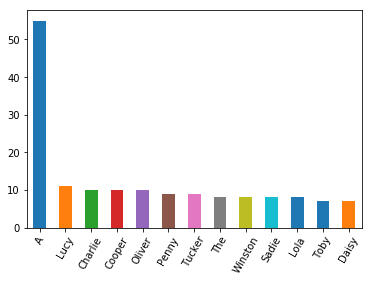

In [94]:
top_names.plot(kind='bar')
plt.xticks(rotation=60)
plt.show()

**Answer:** If we exclude cases, where a letter 'A' and an article 'The' are provided, the most popular names are: Lucy, Charlie, Cooper, Oliver, Tucker, Penny, Winston, Lola, Sadie and Daisy.

---
### Most common dogs' style

In [95]:
top_styles = df_arch_clean.dog_style.value_counts()
top_styles

pupper     221
doggo      83 
puppo      23 
floofer    9  
Name: dog_style, dtype: int64

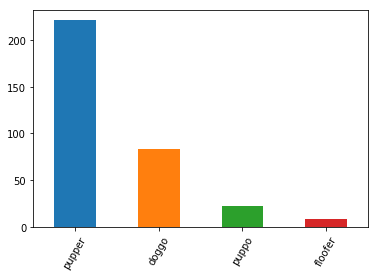

In [96]:
top_styles.plot(kind='bar')
plt.xticks(rotation=60)
plt.show()

**Answer:** The most common dog's style is pupper.

---
### Dogs' rating

In [97]:
df_arch_clean.rating.describe()

count    2096.000000
mean     1.169267   
std      3.966878   
min      0.000000   
25%      1.000000   
50%      1.100000   
75%      1.200000   
max      177.600000 
Name: rating, dtype: float64

In [98]:
# How many % of ratings are above 1.5 (150%)?
len(df_arch_clean[df_arch_clean.rating > 1.5]) / len(df_arch_clean.rating) * 100

0.2862595419847328

**Answer:** There are 2096 dogs' ratings in the dataset. The worst rate is 0, the best is 177.6 (177.6%). The ratings are not normally distributed, their distribution is right-skewed (long-tailed). Most of the ratings are below 150%, only 6 (0.29%) of them are above 150%. With Atticus being the most rated of all. 75% of ratings are 120% or below and only 25% or less are below 100%. Most dogs are very well rated, with the mean rating of 117%.

In [99]:
# The 6 rating outliers
df_arch_clean[df_arch_clean.rating > 1.5]

,tweet_id,timestamp,source,text,rating_numerator,rating_denominator,name,rating,dog_style,retweet_count,favorite_count,followers_count
403,810984652412424192,2016-12-19 23:06:23,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,24,7,Sam,3.428571,NaN,1581,5729,7418531
528,786709082849828864,2016-10-13 23:23:56,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",75,10,Logan,7.500000,NaN,6719,19561,7418542
586,778027034220126208,2016-09-20 00:24:34,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,27,10,Sophie,2.700000,pupper,1780,7029,7418543
769,749981277374128128,2016-07-04 15:00:45,"<a href=""https://about.twitter.com/products/tweetdeck"" rel=""nofollow"">TweetDeck</a>",This is Atticus. He's quite simply America af. 1776/10 https://t.co/GRXwMxLBkh,1776,10,Atticus,177.600000,NaN,2654,5423,7418601
1473,680494726643068929,2015-12-25 21:06:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD,26,10,NaN,2.600000,NaN,519,1799,7418669
1820,670842764863651840,2015-11-29 05:52:33,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",After so many requests... here you go.\n\nGood dogg. 420/10 https://t.co/yfAAo1gdeY,420,10,NaN,42.000000,NaN,9043,25100,7418709


---
### Tweets creation over time

In [100]:
df_arch_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2096 entries, 0 to 2095
Data columns (total 12 columns):
tweet_id              2096 non-null int64
timestamp             2096 non-null datetime64[ns]
source                2096 non-null object
text                  2096 non-null object
rating_numerator      2096 non-null int64
rating_denominator    2096 non-null int64
name                  1493 non-null object
rating                2096 non-null float64
dog_style             336 non-null object
retweet_count         2096 non-null int64
favorite_count        2096 non-null int64
followers_count       2096 non-null int64
dtypes: datetime64[ns](1), float64(1), int64(6), object(4)
memory usage: 212.9+ KB


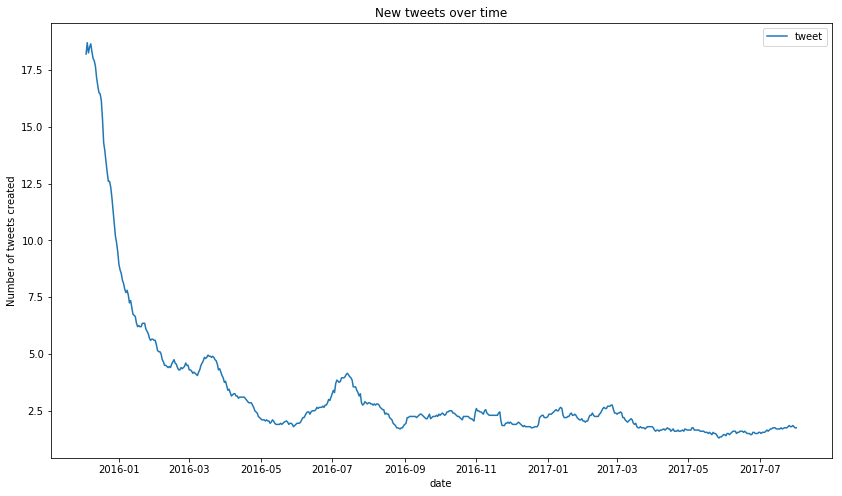

In [101]:
# Create two columns: 'date' to agregate 'datetime' 
# and 'tweet' to sum a number of tweets for a certain date
# by day
df_arch_clean['date'] = df_arch_clean['timestamp'].dt.date
# by week
#df_arch_clean['date'] = df_arch_clean['timestamp'].dt.week
# by month
#df_arch_clean['date'] = df_arch_clean['timestamp'].dt.month
df_arch_clean['tweet'] = 1

# Create a new dataframe with 2 columns, gruped by date
df1 = df_arch_clean[['date', 'tweet']].groupby(['date']).sum() # alternatively .count() could be used

# Use moving averages to smooth the line
df1['tweet'] = df1['tweet'].rolling(window=20).mean()

# Plot
df1.plot(figsize=(14, 8), title='New tweets over time')
plt.ylabel('Number of tweets created')
plt.show()

In [102]:
df1['tweet'].describe()

count    578.000000
mean     3.305623  
std      3.022475  
min      1.300000  
25%      1.850000  
50%      2.300000  
75%      3.250000  
max      18.700000 
Name: tweet, dtype: float64

**Answer:** There were even more than 18 tweets on average created per day at the beginning of 2016 but this frequency quickly collapsed into about 3 on average in 2016 to be even lower in 2017. There is a clear trend of decreasing popularity in terms of creation of new tweets.

---
### Retweets and favorities counts comparing to new tweets creation

In [103]:
# Add rewteets and favorites to the picture
df = df_arch_clean[['date', 'retweet_count', 'favorite_count']]

# Retweets
df2 = df[['date', 'retweet_count']].groupby(['date']).sum()
df2['retweet_count'] = df2['retweet_count'].rolling(window=20).mean()
#df2.plot(figsize=(16, 10))
#plt.show()

# Favorites
df3 = df[['date', 'favorite_count']].groupby(['date']).sum()
df3['favorite_count'] = df3['favorite_count'].rolling(window=20).mean()
#df3.plot(figsize=(16, 10))
#plt.show()

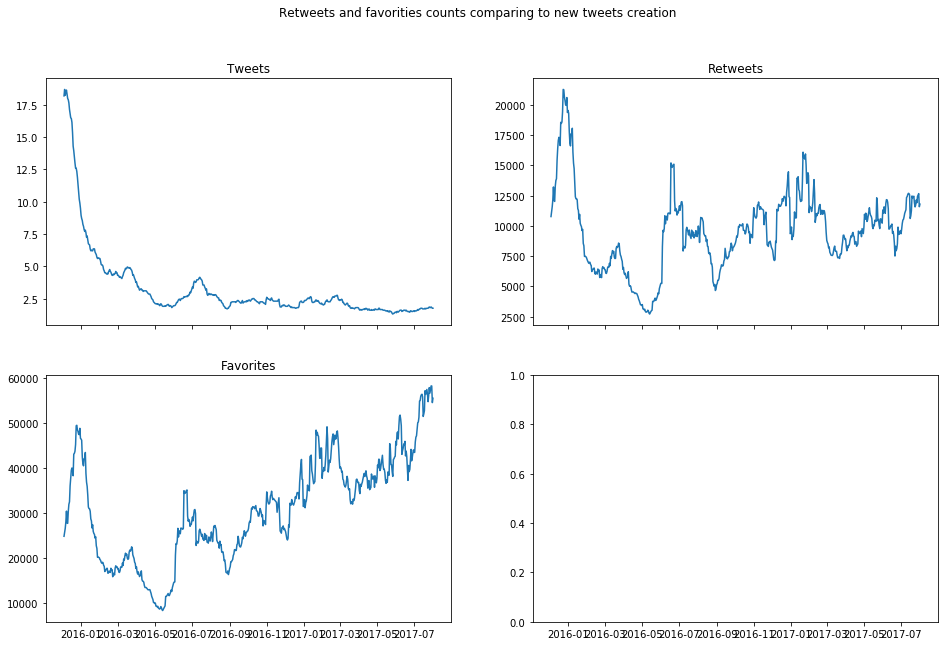

In [104]:
# Everything in a common grid
fig, axs = plt.subplots(2, 2, sharex=True, sharey=False, figsize=(16,10))
fig.suptitle('Retweets and favorities counts comparing to new tweets creation')
axs[0, 0].plot(df1)
axs[0, 0].set_title('Tweets')
#axs[0, 0].set_yscale('log')
axs[0, 1].plot(df2)
axs[0, 1].set_title('Retweets')
#axs[0, 1].set_yscale('log')
axs[1, 0].plot(df3)
axs[1, 0].set_title('Favorites')
#axs[1, 0].set_yscale('log')
plt.show()

**Answer:** 
- Tweets -> after initial boom, the amount of tweets created daily stabilizes on around 2.5 per day on average.
- Retweets -> there is noticable variation of retweets but on average long-term they tend to stay on the same level.
- Favorites -> after initial boom and then colapse, the trend is growing. It seems people still use historical tweets and marke them as favotes or the user base is growing which results in more and more favorites.

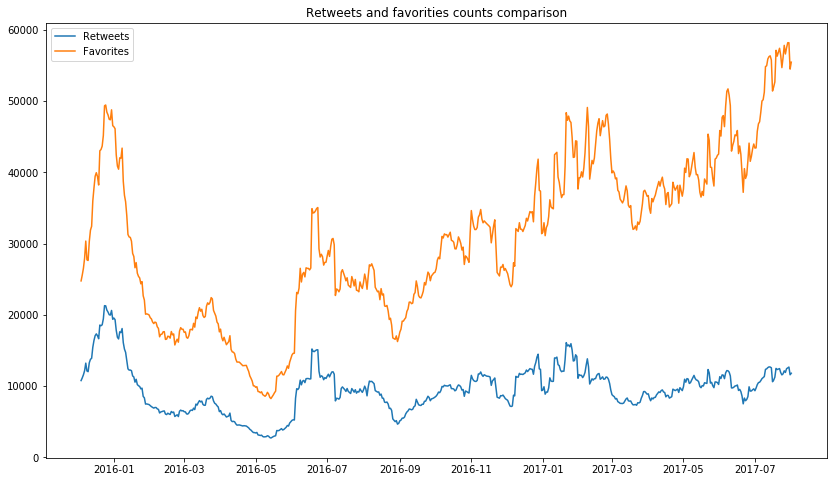

In [105]:
# Compare trends on a log scale for y axis
fig, axs = plt.subplots(1, 1, sharex=True, sharey=False, figsize=(14,8))

axs.set_title('Retweets and favorities counts comparison')
#axs.set_yscale('log')
axs.plot(df2, label='Retweets')
axs.plot(df3, label='Favorites')
axs.legend()

plt.show()

**Answer:** The number of retweets tends to stay at the same level whereas number of favorites grows over time.

---
## Resources
- https://twitter.com/dog_rates
- http://docs.tweepy.org/en/v3.6.0/api.html#api-reference
- https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.to_pickle.html
- https://www.dataquest.io/blog/jupyter-notebook-tips-tricks-shortcuts/
- https://stackoverflow.com/questions/25707558/json-valueerror-expecting-property-name-line-1-column-2-char-1
- https://docs.python.org/3/library/json.html#json.loads
- http://www.jeannicholashould.com/tidy-data-in-python.html
- https://developer.twitter.com/en/docs/tweets/post-and-engage/api-reference/get-statuses-show-id.html
- https://developer.twitter.com/en/docs/tweets/data-dictionary/overview/tweet-object.html
- https://developer.twitter.com/en/docs/tweets/data-dictionary/overview/user-object
- https://media.readthedocs.org/pdf/tweepy/latest/tweepy.pdf
- https://stackabuse.com/reading-and-writing-json-to-a-file-in-python/
- https://stackoverflow.com/questions/25351968/how-to-display-full-non-truncated-dataframe-information-in-html-when-convertin